In [1]:
import os

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="3"

In [41]:
from glob import glob
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import torch
from PIL import Image
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision.transforms.functional import center_crop
from torchvision.utils import make_grid
from tqdm.auto import tqdm

from timm.models import create_model
import segmentation_models_pytorch as smp

In [4]:
TRAIN_PATH = "./facades/train/"
VAL_PATH = "./facades/val/"
TEST_PATH = "./facades/test/"

In [6]:
class FacadesDataset(Dataset):
    def __init__(self, path, target_size=None):
        self.filenames = glob(path + "*")
        self.target_size = target_size

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        filename = self.filenames[idx]
        image = Image.open(filename)
        image = transforms.functional.to_tensor(image)
        image_width = image.shape[2]

        real = image[:, :, : image_width // 2]
        condition = image[:, :, image_width // 2 :]

        target_size = self.target_size
        if target_size:
            condition = nn.functional.interpolate(condition, size=target_size)
            real = nn.functional.interpolate(real, size=target_size)

        return real, condition

In [73]:
class Generator(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super(Generator, self).__init__()
        self.model = smp.Unet(
            encoder_name="resnet18",
            encoder_weights="imagenet",
            in_channels=in_channels,
            classes=out_channels,
        )
    
    def forward(self, x):
        return torch.sigmoid(self.model(x))
    
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = create_model(
                    model_name="resnet18",
                    pretrained=True,
                    num_classes=1,
                )
        self.model.conv1 = nn.Conv2d(6, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        
    def forward(self, x, y):
        x = torch.cat([x, y], axis=1)
        return self.model(x)
    
generator = Generator()
discriminator = Discriminator()

In [74]:
def display_progress(cond, fake, real, figsize=(10, 5)):
    cond = transforms.ToPILImage()(cond)
    fake = transforms.ToPILImage()(fake)
    real = transforms.ToPILImage()(real)
    
    fig, ax = plt.subplots(1, 3, figsize=figsize)
    ax[0].imshow(cond)
    ax[2].imshow(fake)
    ax[1].imshow(real)
    plt.show()

## Часть первая: перенос стиля при помощи pix2pix

In [75]:
class Trainer:
    def __init__(self, generator, discriminator, confs):
        self.generator = generator.to(device)
        self.discriminator = discriminator.to(device)
        self.confs = confs
        self.adversarial_criterion = nn.BCEWithLogitsLoss()
        self.recon_criterion = nn.L1Loss()
        
        self.gen_opt = torch.optim.Adam(self.generator.parameters(), lr=confs["g_lr"])
        self.disc_opt = torch.optim.Adam(self.discriminator.parameters(), lr=confs["d_lr"])
    
    def train_epoch(self, dataset):
        self.generator.train()
        self.discriminator.train()
        d_losses = []
        g_losses = []
        for (real, condition) in tqdm(dataset):
            real, condition = real.to(device), condition.to(device)
            fake_images = self.generator(condition)
            disc_logits = self.discriminator(fake_images, condition)
            adversarial_loss = self.adversarial_criterion(disc_logits, torch.ones_like(disc_logits))

            recon_loss = self.recon_criterion(fake_images, real)
            loss1 = adversarial_loss + self.confs["lambda_recon"] * recon_loss
            g_losses.append(loss1.item())
            self.gen_opt.zero_grad()
            loss1.backward()
            self.gen_opt.step()
            
            fake_images = self.generator(condition).detach()
            fake_logits = self.discriminator(fake_images, condition)
            real_logits = self.discriminator(real, condition)
            fake_loss = self.adversarial_criterion(fake_logits, torch.zeros_like(fake_logits))
            real_loss = self.adversarial_criterion(real_logits, torch.ones_like(real_logits))
            
            loss2 = (real_loss + fake_loss) / 2
            d_losses.append(loss2.item())
            self.disc_opt.zero_grad()
            loss2.backward()
            self.disc_opt.step()
        return np.mean(g_losses), np.mean(d_losses)
    
    def eval(self, dataset):
        for (real, condition) in dataset:
            fake = self.generator(condition.to(device)).detach()
            display_progress(condition[0], fake[0], real[0])
            break
    
    def train(self):
        train_dataset = FacadesDataset(TRAIN_PATH)
        val_dataset = FacadesDataset(VAL_PATH)
#         test_dataset = FacadesDataset(TEST_PATH)
        
        train_dataloader = DataLoader(train_dataset, batch_size=self.confs["batch_size"], shuffle=True)
        val_dataloader = DataLoader(val_dataset, batch_size=self.confs["batch_size"], shuffle=True)
        
        for epoch in range(1, self.confs["num_epochs"]):
            g_loss, d_loss = self.train_epoch(train_dataloader)
            
            if epoch % 20 == 0:
                print(f"Epoch: {epoch}, Generator loss {g_loss}, discriminator loss {d_loss}")
                self.eval(val_dataloader)

In [76]:
device = torch.device("cuda")
confs = {
    "lambda_recon": 200,
    "g_lr": 2e-4, 
    "d_lr": 2e-4,
    "num_epochs": 20,
    "batch_size": 4,
}

trainer = Trainer(generator, discriminator, confs)

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 1, Generator loss 40.459632892608646, discriminator loss 0.3887857324630022


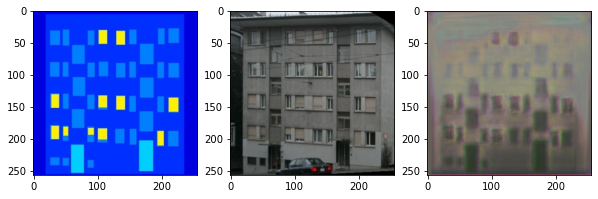

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 2, Generator loss 37.41826093673706, discriminator loss 0.2459978612884879


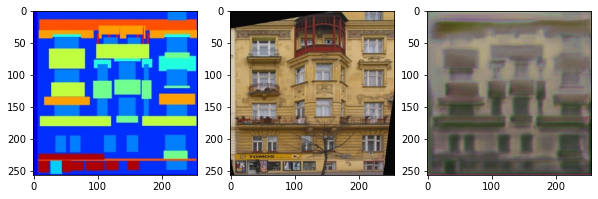

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 3, Generator loss 36.3122149848938, discriminator loss 0.21629361340776085


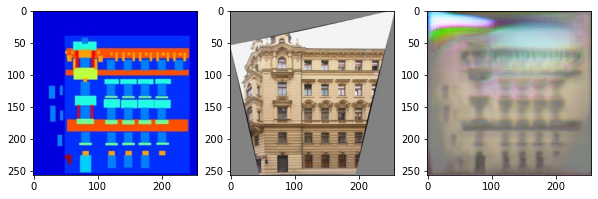

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 4, Generator loss 37.09570058822632, discriminator loss 0.24413238592445852


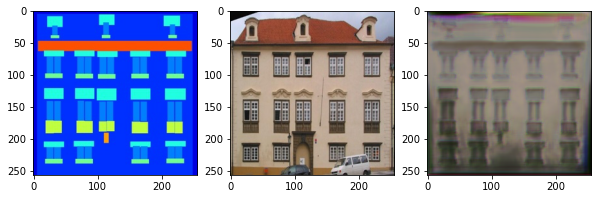

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 5, Generator loss 36.88724704742432, discriminator loss 0.1772843984887004


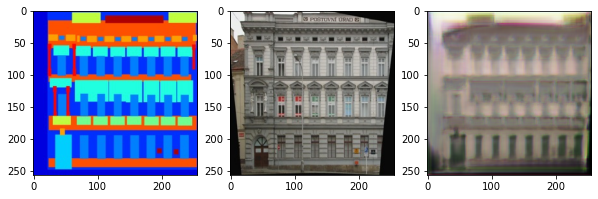

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 6, Generator loss 36.17764154434204, discriminator loss 0.10557906225323677


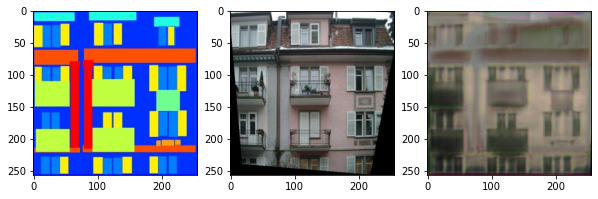

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 7, Generator loss 34.74596935272217, discriminator loss 0.21625388542190194


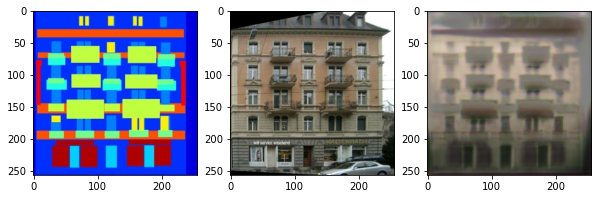

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 8, Generator loss 34.98016153335571, discriminator loss 0.014944943794980646


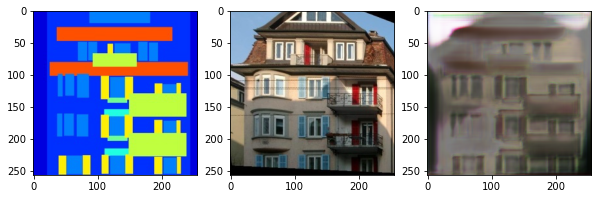

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 9, Generator loss 34.41649917602539, discriminator loss 0.012128341845236718


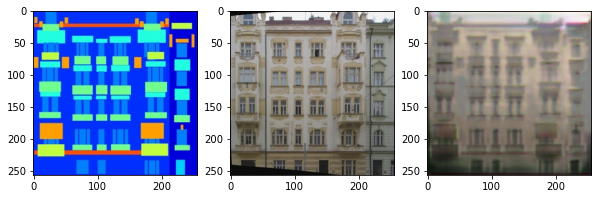

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 10, Generator loss 34.0221928024292, discriminator loss 0.05768116734456271


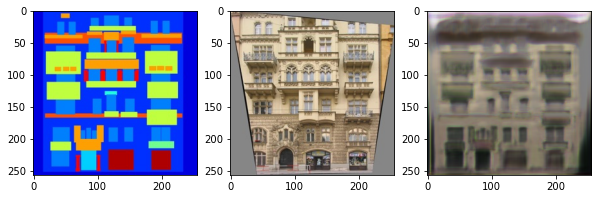

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 11, Generator loss 33.189183406829834, discriminator loss 0.13822715371381492


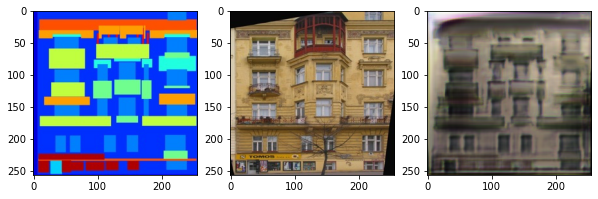

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 12, Generator loss 32.7579231262207, discriminator loss 0.09720162288285791


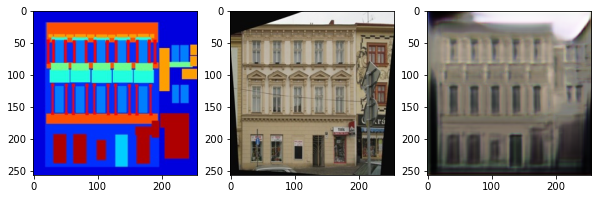

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 13, Generator loss 32.98561227798462, discriminator loss 0.008651119670830668


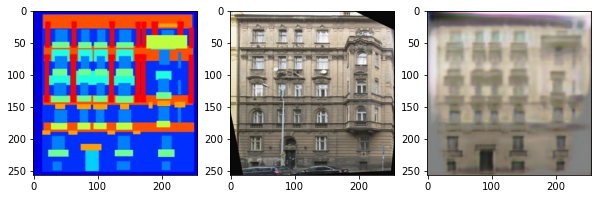

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 14, Generator loss 32.26105529785156, discriminator loss 0.004967624642886221


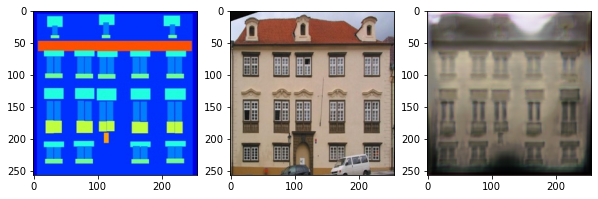

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 15, Generator loss 32.006189575195314, discriminator loss 0.005794982574880123


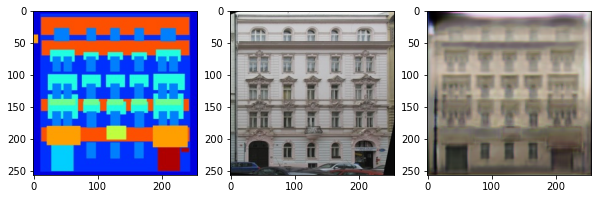

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 16, Generator loss 31.559822902679443, discriminator loss 0.17259046534541994


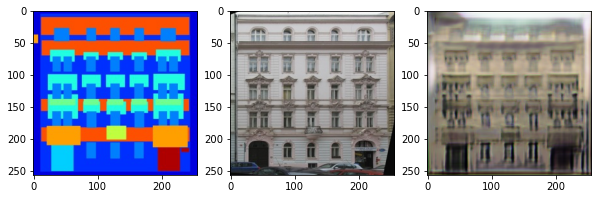

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 17, Generator loss 30.663116607666016, discriminator loss 0.2537416187673807


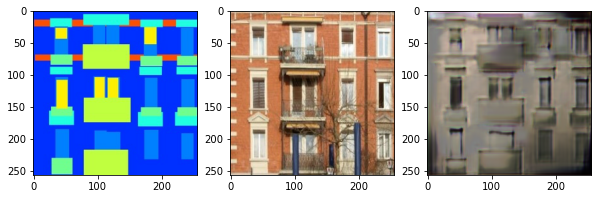

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 18, Generator loss 29.524883155822753, discriminator loss 0.23518792480230333


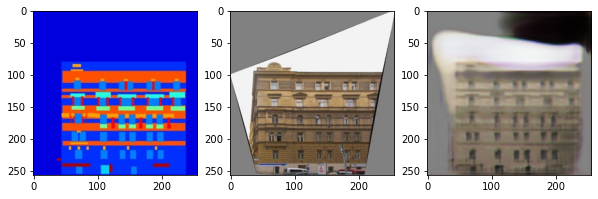

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 19, Generator loss 29.56295696258545, discriminator loss 0.14334346585907043


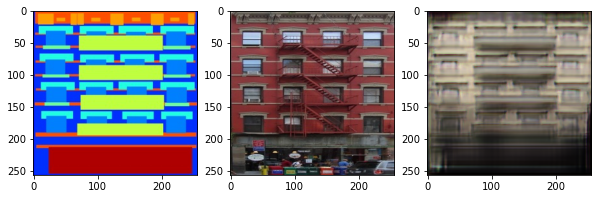

In [77]:
trainer.train()

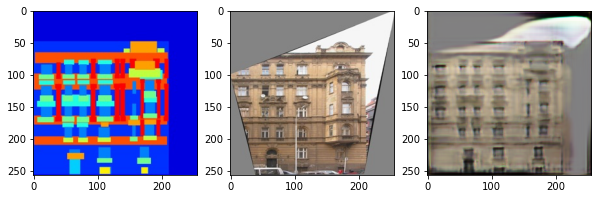

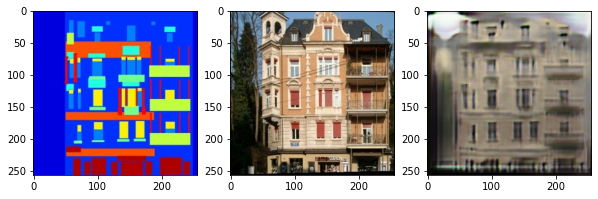

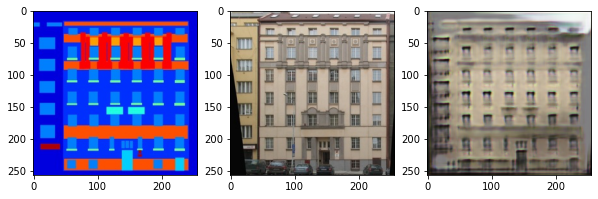

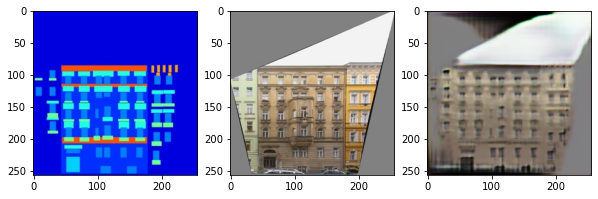

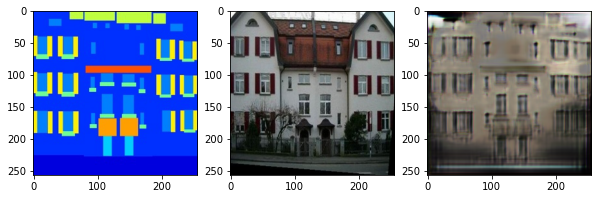

...

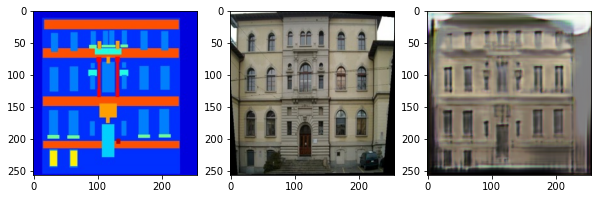

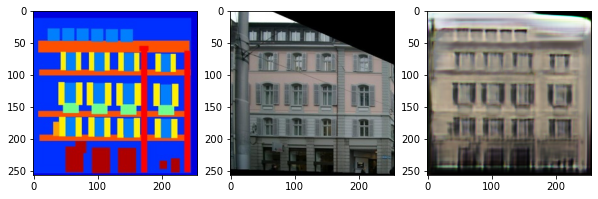

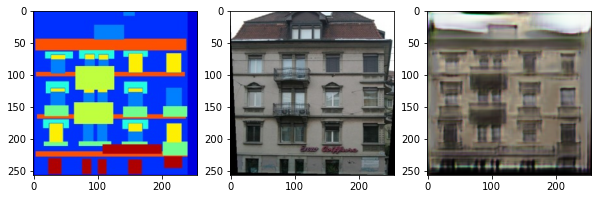

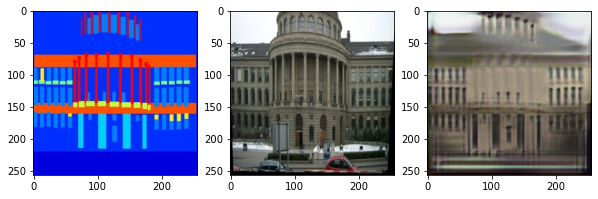

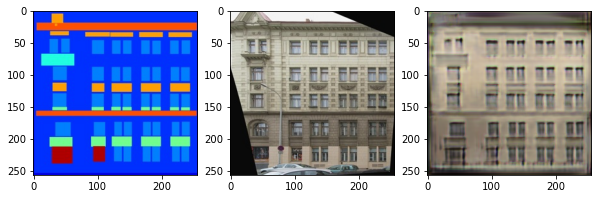

In [78]:
test_dataset = FacadesDataset(TEST_PATH)
test_dataloader = DataLoader(test_dataset, batch_size=confs["batch_size"], shuffle=False)

i = 0
for (real, condition) in test_dataloader:
    fake = generator(condition.to(device)).detach()
    display_progress(condition[0], fake[0], real[0])
    i += 1
    if i > 10:
        break

## Часть вторая: добавим циклы

Вторая часть -- реализация CycleGAN. Предлагается на том же датасете реализовать базовую конструкцию CycleGAN для unpaired style transfer, то есть переноса стилей, каждый из которых задан неразмеченным датасетом (подробнее см. лекцию и собственно Zhu et al., 2017):


In [79]:
class CycleTrainer:
    def __init__(self, generator1, discriminator1, generator2, discriminator2, confs):
        self.generator1 = generator1.to(device)
        self.discriminator1 = discriminator1.to(device)
        
        self.generator2 = generator2.to(device)
        self.discriminator2 = discriminator2.to(device)
        
        self.confs = confs
        self.adversarial_criterion = nn.BCEWithLogitsLoss()
        self.recon_criterion = nn.L1Loss()
        
        self.gen_opt1 = torch.optim.Adam(self.generator1.parameters(), lr=confs["g_lr"])
        self.disc_opt1 = torch.optim.Adam(self.discriminator1.parameters(), lr=confs["d_lr"])
        self.gen_opt2 = torch.optim.Adam(self.generator2.parameters(), lr=confs["g_lr"])
        self.disc_opt2 = torch.optim.Adam(self.discriminator2.parameters(), lr=confs["d_lr"])
    
    def generator_train(self, real, condition, generator, discriminator, optimizer, generator2):
        fake_images = generator(condition)
        disc_logits = discriminator(fake_images, condition)
        adversarial_loss = self.adversarial_criterion(disc_logits, torch.ones_like(disc_logits))

        rec_images = generator2(fake_images)
        cycle_loss = self.recon_criterion(rec_images, condition)

        recon_loss = self.recon_criterion(fake_images, real)
        loss = adversarial_loss + self.confs["lambda_recon"] * recon_loss + cycle_loss
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        return loss.item()
    
    def discriminator_train(self, real, condition, generator, discriminator, optimizer):
        fake_images = generator(condition).detach()
        fake_logits = discriminator(fake_images, condition)
        real_logits = discriminator(real, condition)
        fake_loss = self.adversarial_criterion(fake_logits, torch.zeros_like(fake_logits))
        real_loss = self.adversarial_criterion(real_logits, torch.ones_like(real_logits))

        loss = (real_loss + fake_loss) / 2
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        return loss.item()
    
    def train_epoch(self, dataset):
        self.generator1.train()
        self.discriminator1.train()
        self.generator2.train()
        self.discriminator2.train()
        d_losses1 = []
        g_losses1 = []
        d_losses2 = []
        g_losses2 = []
        for (real, condition) in tqdm(dataset):
            real, condition = real.to(device), condition.to(device)
            loss11 = self.generator_train(real, condition, self.generator1, self.discriminator1, self.gen_opt1, self.generator2)
            loss12 = self.generator_train(condition, real, self.generator2, self.discriminator2, self.gen_opt2, self.generator1)
            
            g_losses1.append(loss11)
            g_losses2.append(loss12)
            
            loss21 = self.discriminator_train(real, condition, self.generator1, self.discriminator1, self.disc_opt1)
            loss22 = self.discriminator_train(condition, real, self.generator2, self.discriminator2, self.disc_opt2)
            d_losses1.append(loss21)
            d_losses2.append(loss22)
        return np.mean(g_losses1), np.mean(d_losses1)
    
    def eval(self, dataset):
        for (real, condition) in dataset:
            fake = self.generator1(condition.to(device)).detach()
            display_progress(condition[0], fake[0], real[0])
            break
    
    def train(self):
        train_dataset = FacadesDataset(TRAIN_PATH)
        val_dataset = FacadesDataset(VAL_PATH)
#         test_dataset = FacadesDataset(TEST_PATH)
        
        train_dataloader = DataLoader(train_dataset, batch_size=self.confs["batch_size"], shuffle=True)
        val_dataloader = DataLoader(val_dataset, batch_size=self.confs["batch_size"], shuffle=True)
        
        for epoch in range(1, self.confs["num_epochs"]):
            g_loss, d_loss = self.train_epoch(train_dataloader)
            print(f"Epoch: {epoch}, Generator loss {g_loss}, discriminator loss {d_loss}")
            self.eval(val_dataloader)

In [80]:
generator_sg1 = Generator()
generator_sg2 = Generator()
discriminator_sg1 = Discriminator()
discriminator_sg2 = Discriminator()

In [81]:
device = torch.device("cuda")
confs = {
    "lambda_recon": 200,
    "g_lr": 2e-4, 
    "d_lr": 2e-4,
    "num_epochs": 20,
    "batch_size": 4,
}

trainer = CycleTrainer(generator_sg1, discriminator_sg1, generator_sg2, discriminator_sg2, confs)

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 1, Generator loss 39.4627548789978, discriminator loss 0.4374807196110487


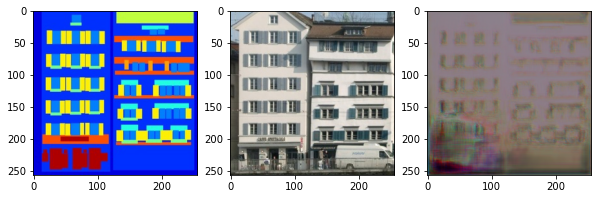

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 2, Generator loss 38.7324715423584, discriminator loss 0.19603432271629573


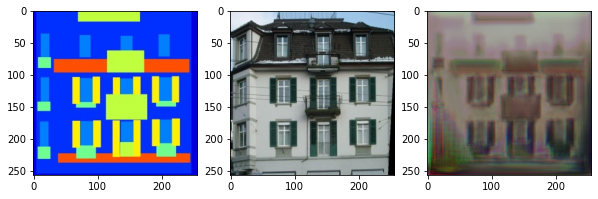

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 3, Generator loss 38.717787685394285, discriminator loss 0.017407938982360066


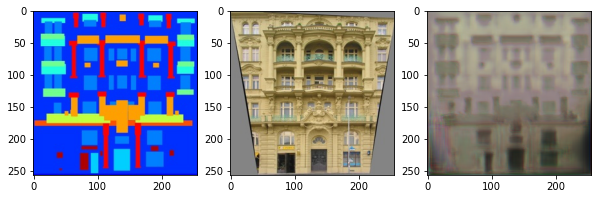

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 4, Generator loss 37.93442470550537, discriminator loss 0.04481624815613031


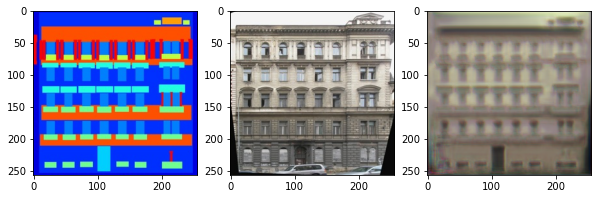

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 5, Generator loss 35.760939025878905, discriminator loss 0.22544793017208575


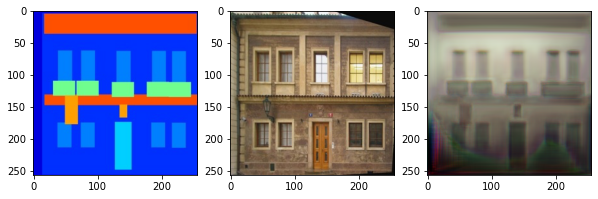

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 6, Generator loss 35.680310230255124, discriminator loss 0.05290222056210041


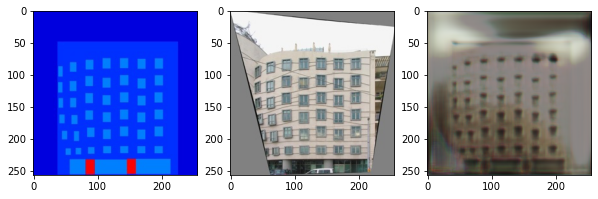

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 7, Generator loss 35.52314790725708, discriminator loss 0.09521115726791322


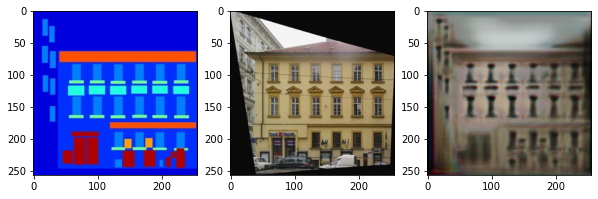

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 8, Generator loss 34.94084245681763, discriminator loss 0.20288424220867454


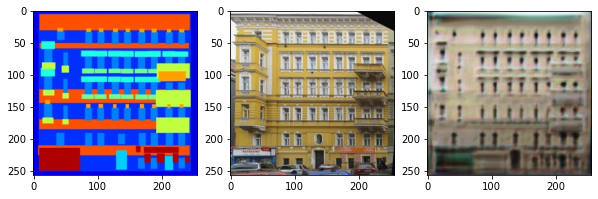

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 9, Generator loss 34.63732435226441, discriminator loss 0.18587076167576014


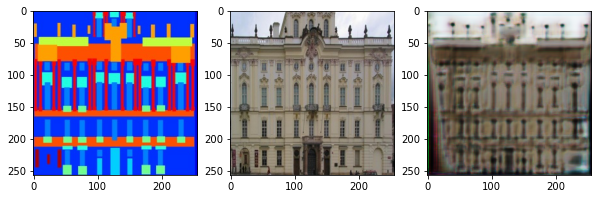

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 10, Generator loss 33.81442691802979, discriminator loss 0.05346066718921065


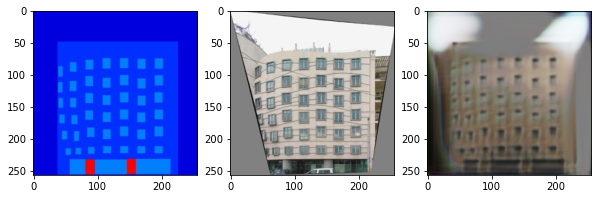

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 11, Generator loss 32.86875768661499, discriminator loss 0.006991750609595329


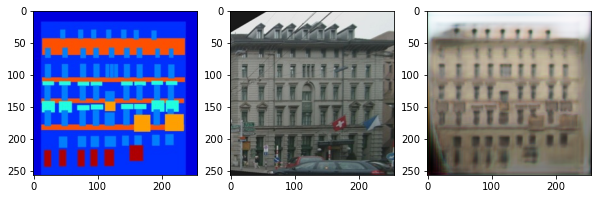

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 12, Generator loss 32.40722812652588, discriminator loss 0.00428612238029018


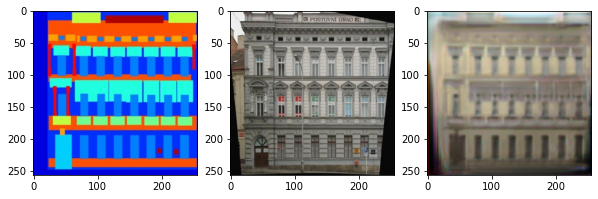

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 13, Generator loss 31.026176986694335, discriminator loss 0.19808637495618314


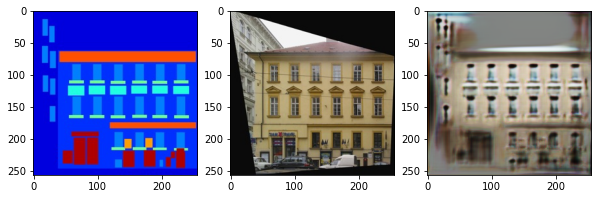

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 14, Generator loss 30.05170654296875, discriminator loss 0.2595070253312588


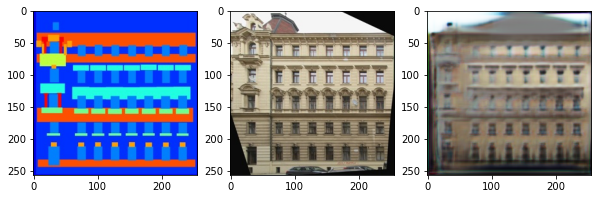

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 15, Generator loss 30.31807083129883, discriminator loss 0.2038363546039909


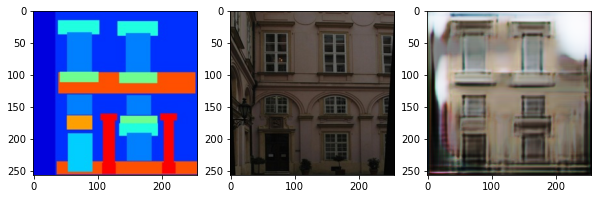

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 16, Generator loss 28.97535135269165, discriminator loss 0.23770093596540393


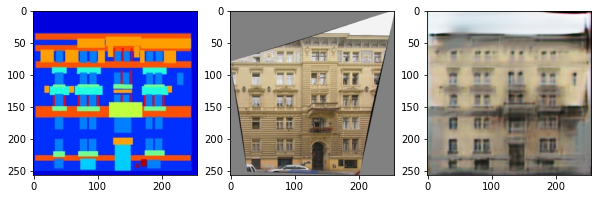

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 17, Generator loss 29.448944873809815, discriminator loss 0.2567084377724677


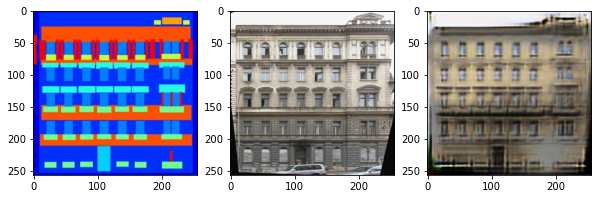

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 18, Generator loss 28.59957311630249, discriminator loss 0.3248013433068991


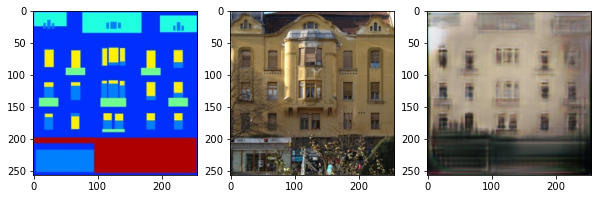

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch: 19, Generator loss 28.383891029357912, discriminator loss 0.13352035643532872


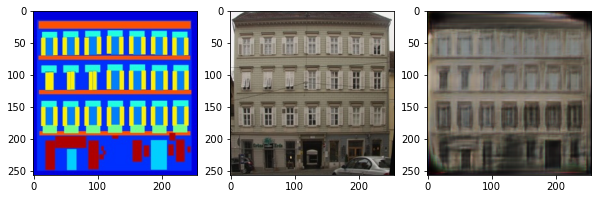

In [82]:
trainer.train()

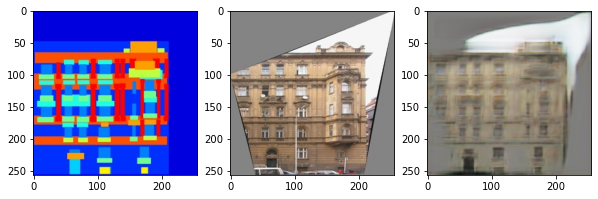

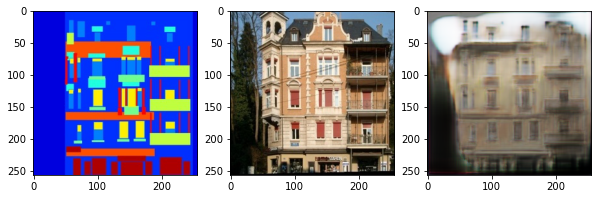

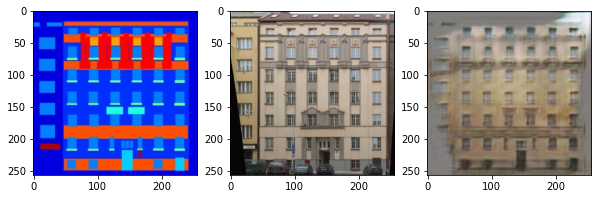

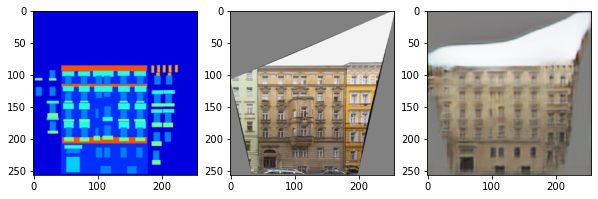

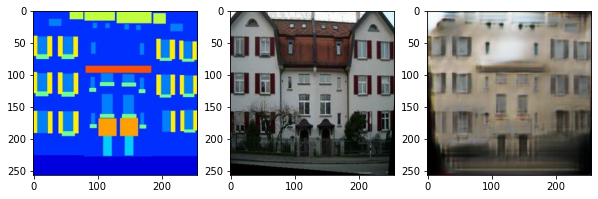

...

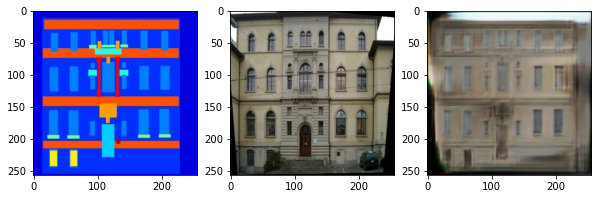

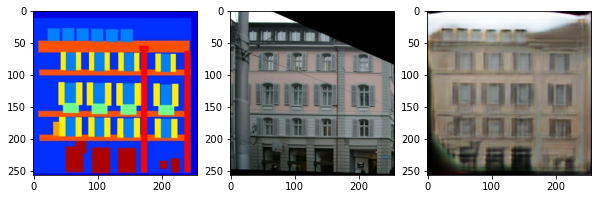

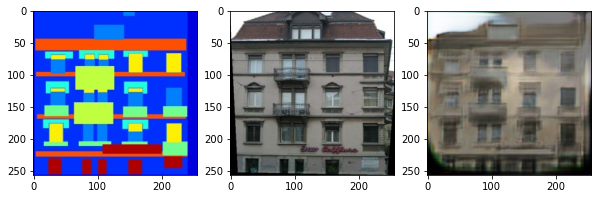

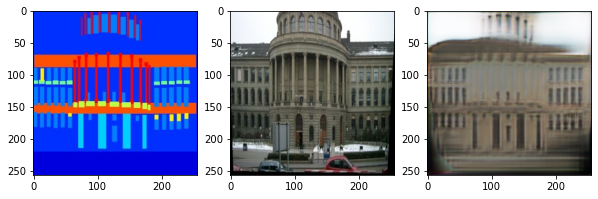

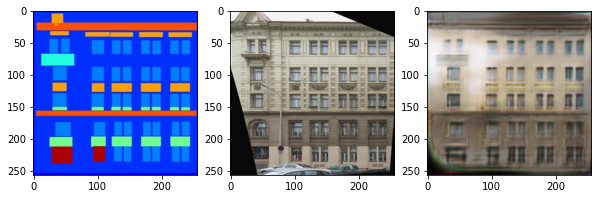

In [83]:
test_dataset = FacadesDataset(TEST_PATH)
test_dataloader = DataLoader(test_dataset, batch_size=confs["batch_size"], shuffle=False)

i = 0
for (real, condition) in test_dataloader:
    fake = generator_sg1(condition.to(device)).detach()
    display_progress(condition[0], fake[0], real[0])
    i += 1
    if i > 10:
        break